<a href="https://colab.research.google.com/github/mobarakol/mono_reconstruction/blob/main/finetuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Download phantom data and SCARED weights

In [1]:
import gdown

data_url = 'https://drive.google.com/uc?id=1x8xwQAMrQzJP3ikbasO8G3A4d_6cjEkx'
gdown.download(data_url,'Endonasal_Phantom.zip',quiet=True)
!unzip -q Endonasal_Phantom.zip


weights_url = 'https://drive.google.com/uc?id=1ZfkVLPhQW-nTEjLo6ONn6QmhVQTkxgCK'
gdown.download(weights_url,'weights_scared.zip',quiet=True)
!unzip -q weights_scared.zip

Download the code for mono depth, pose and reconstruction

In [2]:
!git clone https://github.com/mobarakol/mono_reconstruction.git
%cd mono_reconstruction

Cloning into 'mono_reconstruction'...
remote: Enumerating objects: 121, done.
remote: Counting objects: 100% (121/121), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 121 (delta 53), reused 53 (delta 18), pack-reused 0
Receiving objects: 100% (121/121), 4.91 MiB | 4.39 MiB/s, done.
Resolving deltas: 100% (53/53), done.
/content/mono_reconstruction


In [ ]:
!rm -rf ../mono_reconstruction
%cd /content

/content


Installation

In [3]:
!pip -q install tensorboardX open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 59.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 92.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 82.8 MB/s eta 0:00:00


In [44]:
!python train_end_to_end.py --data_path ../Endonasal_Phantom/ --dataset endonasal --log_dir logs_withpretrained --load_weights_folder ../weights_scared --num_epochs 6 --batch_size 8

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100% 44.7M/44.7M [00:00<00:00, 139MB/s]
Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth
100% 44.7M/44.7M [00:00<00:00, 244MB/s]
load

Reconstruction from SCARED trained model:

In [ ]:
!python evaluate_3d_reconstruction.py --data_path ../Endonasal_Phantom/ --dataset endonasal --eval_mono --load_weights_folder ../weights_scared --visualize_depth --save_recon

-> Loading weights from ../weights_scared
Preparing endonasal dataloader.
sample size: 5
-> Computing predictions with size 320x256
  0% 0/5 [00:00<?, ?it/s]batch_size 17
 20% 1/5 [00:02<00:10,  2.54s/it]batch_size 17
batch_size 17
batch_size 17
batch_size 17
100% 5/5 [00:02<00:00,  1.83it/s]
-> Reconstructing
  0% 0/5 [00:00<?, ?it/s]bef 247.0 2.0 0.40993747 0.24705903
filepath[i]: ../Endonasal_Phantom/reconstruction/00000029.png
scale 100
aft 247.0 2.0 40.993748 24.705904
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]
bef 237.0 7.0 0.44739783 0.18851873
filepath[i]: ../Endonasal_Phantom/reconstruction/00000050.png
scale 100
aft 237.0 7.0 44.739784 18.851873
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]
bef 249.0 1.0 0.45286188 0.21629855
filepath[i]: ../Endonasal_Phantom/reconstruction/00000063.png
scale 100
aft 249.0 1.0 45.286186 21.629854
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]
 60% 3/5 [00:00

In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('reconstruction_scale/00000079.ply')
points = np.asarray(pcd.points)
# print(pcd)
# print(np.asarray(pcd.points))

colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5


fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()

Reconstruction from Endonasal finetune model:

In [ ]:
!python evaluate_3d_reconstruction.py --data_path ../Endonasal_Phantom/ --dataset endonasal --eval_mono --load_weights_folder logs_withpretrained/mdp/models/weights_5 --visualize_depth --save_recon --recon_save_dir recon_endonasal

-> Loading weights from logs_withpretrained/mdp/models/weights_5
Preparing endonasal dataloader.
sample size: 5
-> Computing predictions with size 320x256
  0% 0/5 [00:00<?, ?it/s]batch_size 17
 20% 1/5 [00:01<00:07,  1.98s/it]batch_size 17
batch_size 17
batch_size 17
batch_size 17
100% 5/5 [00:02<00:00,  2.19it/s]
-> Reconstructing
  0% 0/5 [00:00<?, ?it/s]
bef 247.0 2.0 2.9632578 0.16425848
filepath[i]: ../Endonasal_Phantom/reconstruction/00000029.png
scale 200
aft 247.0 2.0 150.0 32.851696
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]

bef 237.0 7.0 3.868784 0.20201878
filepath[i]: ../Endonasal_Phantom/reconstruction/00000050.png
scale 200
aft 237.0 7.0 150.0 40.403755
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]

bef 249.0 1.0 1.3785465 0.16833344
filepath[i]: ../Endonasal_Phantom/reconstruction/00000063.png
scale 200
aft 249.0 1.0 150.0 33.666687
intrinsic [[243.2   0.  150.4]
 [  0.  345.6 115.2]
 [  0.    0.    1. ]]

bef 

In [ ]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('recon_endonasal/00000079.ply')
points = np.asarray(pcd.points)
# print(pcd)
# print(np.asarray(pcd.points))

colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5


fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()

Code for reconstruction:

-> Loading weights from ../weights_scared
Preparing endonasal dataloader.
sample size: 5
-> Computing predictions with size 320x256


100%|██████████| 5/5 [00:02<00:00,  2.32it/s]


-> Reconstructing



100%|██████████| 5/5 [00:00<00:00, 24.95it/s]

filepath[i]: ../Endonasal_Phantom/reconstruction/00000029.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000050.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000063.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000079.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000134.png (256, 320)
Saving point clouds...


Point clouds saved to recon_endonasal_scared


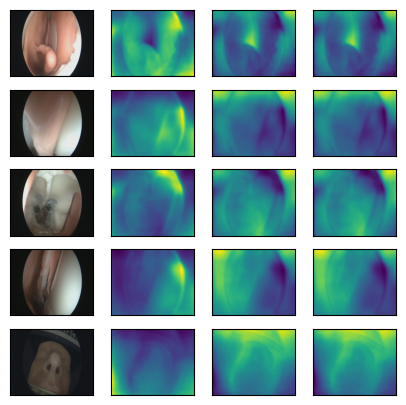

In [50]:
import os
import cv2
import numpy as np
from tqdm import tqdm
import time
import sys

import torch
from torch.utils.data import DataLoader
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import open3d as o3d

from layers import disp_to_depth
from utils import readlines
from options import MonodepthOptions
import datasets
import networks
import warnings
warnings.filterwarnings('ignore')

def render_depth(values, colormap_name="magma_r") -> Image:
    min_value, max_value = values.min(), values.max()
    normalized_values = (values - min_value) / (max_value - min_value)

    colormap = matplotlib.colormaps[colormap_name]
    colors = colormap(normalized_values, bytes=True) # ((1)xhxwx4)
    colors = colors[:, :, :3] # Discard alpha component
    return Image.fromarray(colors)


def reconstruct_pointcloud(rgb, depth, cam_K, vis_rgbd=False):

    rgb = np.asarray(rgb, order="C")
    rgb_im = o3d.geometry.Image(rgb.astype(np.uint8))
    depth_im = o3d.geometry.Image(depth)

    rgbd_image = o3d.geometry.RGBDImage.create_from_color_and_depth(rgb_im, depth_im, convert_rgb_to_intensity=False)
    if vis_rgbd:
        plt.subplot(1, 2, 1)
        plt.title('RGB image')
        plt.imshow(rgbd_image.color)
        plt.subplot(1, 2, 2)
        plt.title('Depth image')
        plt.imshow(rgbd_image.depth)
        plt.colorbar()
        plt.show()

    cam = o3d.camera.PinholeCameraIntrinsic()
    cam.intrinsic_matrix = cam_K

    pcd = o3d.geometry.PointCloud.create_from_rgbd_image(
        rgbd_image,
        cam
    )

    return pcd


def evaluate(opt):
    """Evaluates a pretrained model using a specified test set
    """
    MIN_DEPTH = 1e-3
    MAX_DEPTH = 150

    assert sum((opt.eval_mono, opt.eval_stereo)) == 1, \
        "Please choose mono or stereo evaluation by setting either --eval_mono or --eval_stereo"

    opt.load_weights_folder = os.path.expanduser(opt.load_weights_folder)

    assert os.path.isdir(opt.load_weights_folder), \
        "Cannot find a folder at {}".format(opt.load_weights_folder)

    print("-> Loading weights from {}".format(opt.load_weights_folder))

    encoder_path = os.path.join(opt.load_weights_folder, "encoder.pth")
    decoder_path = os.path.join(opt.load_weights_folder, "depth.pth")

    encoder_dict = torch.load(encoder_path)
    if opt.dataset == "endonasal":
            print('Preparing endonasal dataloader.')
            seqs_recons = ['reconstruction']
            dataset_recon = datasets.EndonasalDataset(
                opt.data_path, seqs_recons, opt.height, opt.width, [0], 4, is_train=False)

            num_train_samples = len(dataset_recon)
    else:
        filenames = readlines(os.path.join(splits_dir, opt.eval_split, "3d_reconstruction.txt"))
        dataset_recon = datasets.SCAREDRAWDataset(opt.data_path, filenames,
                                        encoder_dict['height'], encoder_dict['width'],
                                        [0], 4, is_train=False)

    # save_dir = "reconstruction_scale"
    os.makedirs(opt.recon_save_dir, exist_ok=True)

    dataloader = DataLoader(dataset_recon, 1, shuffle=False, num_workers=opt.num_workers,
                            pin_memory=True, drop_last=False)
    print('sample size:', len(dataset_recon))
    encoder = networks.ResnetEncoder(opt.num_layers, False)
    depth_decoder = networks.DepthDecoder(encoder.num_ch_enc, scales=range(4))

    model_dict = encoder.state_dict()
    encoder.load_state_dict({k: v for k, v in encoder_dict.items() if k in model_dict})
    depth_decoder.load_state_dict(torch.load(decoder_path))

    encoder.cuda()
    encoder.eval()
    depth_decoder.cuda()
    depth_decoder.eval()

    rgbs = []
    pred_disps = []
    cam_Ks = []
    inference_times = []
    filepath = []

    print("-> Computing predictions with size {}x{}".format(
        encoder_dict['width'], encoder_dict['height']))

    with torch.no_grad():
        for data in tqdm(dataloader):
            input_color = data[("color", 0, 0)].cuda()
            if opt.post_process:
                # Post-processed results require each image to have two forward passes
                input_color = torch.cat((input_color, torch.flip(input_color, [3])), 0)

            time_start = time.time()
            output = depth_decoder(encoder(input_color))
            inference_time = time.time() - time_start
            pred_disp, _ = disp_to_depth(output[("disp", 0)], opt.min_depth, opt.max_depth)
            pred_disp = pred_disp.cpu()[:, 0].numpy()

            rgbs.append(input_color)
            pred_disps.append(pred_disp)
            cam_Ks.append(data[("K", 0)])
            inference_times.append(inference_time)
            filepath.append(data['filepath'][0])


    pred_disps = np.concatenate(pred_disps)


    if opt.visualize_depth:
        vis_dir = os.path.join(opt.load_weights_folder, "vis_depth")
        os.makedirs(vis_dir, exist_ok=True)

    print("-> Reconstructing\n")
    fig, axs = plt.subplots(pred_disps.shape[0], 4, figsize=(1*5, pred_disps.shape[0]*1), subplot_kw=dict(xticks=[],yticks=[]))
    pcds = []
    for i in tqdm(range(pred_disps.shape[0])):

        pred_disp = pred_disps[i]
        pred_depth = 1/pred_disp
        pred_height, pred_width = pred_depth.shape[:2]
        img = rgbs[i].squeeze().permute(1,2,0).cpu().numpy()
        mask = np.ones((pred_height, pred_width))
        mask[img[:,:,0]==0] = 0
        rgb = rgbs[i].squeeze().permute(1,2,0).cpu().numpy() * 255
        axs[i, 0].imshow(rgbs[i].squeeze().permute(1,2,0).cpu().numpy())
        # axs[i, 0].imshow(mask)
        axs[i, 1].imshow(pred_disp)
        axs[i, 2].imshow(pred_depth)
        cam_K = cam_Ks[i][0,:3,:3].numpy()
        if opt.visualize_depth:
            vis_pred_depth = render_depth(pred_depth)
            print('filepath[i]:',filepath[i], pred_depth.shape)
            vis_file_name = os.path.join(vis_dir, os.path.basename(filepath[i]))
            vis_pred_depth.save(vis_file_name)

        scale = 200
        pred_depth *= scale

        pred_depth[pred_depth < MIN_DEPTH] = MIN_DEPTH
        pred_depth[pred_depth > MAX_DEPTH] = MAX_DEPTH
        axs[i, 3].imshow(pred_depth)
        pcd = reconstruct_pointcloud(rgb, pred_depth, cam_K, vis_rgbd=False)
        # o3d.visualization.draw_geometries([pcd])
        pcds.append(pcd)
    print('Saving point clouds...')
    for i, pcd in enumerate(pcds):
        fn = os.path.join(opt.recon_save_dir, os.path.basename(filepath[i])[:-4] + ".ply")
        o3d.io.write_point_cloud(fn, pcd)

    print('Point clouds saved to', opt.recon_save_dir)

# options = MonodepthOptions()
class MonodepthOptions_notebook(MonodepthOptions):
    def __init__(self):
        super(MonodepthOptions_notebook, self).__init__()

    def parse(self):
        if 'ipykernel' in sys.modules:
            self.options = self.parser.parse_args([])
        else:
            self.options = self.parser.parse_args()
        return self.options


if __name__ == "__main__":
    opt = MonodepthOptions_notebook().parse()
    opt.data_path = '../Endonasal_Phantom/'
    opt.dataset = 'endonasal'
    opt.eval_split = 'endovis'
    # opt.load_weights_folder = 'logs_withpretrained/mdp/models/weights_5'
    opt.load_weights_folder = '../weights_scared'
    opt.recon_save_dir = 'recon_endonasal_scared'
    opt.batch_size = 8
    opt.eval_mono = 1
    opt.visualize_depth = 1
    opt.save_recon = 1
    evaluate(opt)

-> Loading weights from logs_withpretrained/mdp/models/weights_4
Preparing endonasal dataloader.
sample size: 5
-> Computing predictions with size 320x256


100%|██████████| 5/5 [00:01<00:00,  2.79it/s]


-> Reconstructing



100%|██████████| 5/5 [00:00<00:00, 26.20it/s]


filepath[i]: ../Endonasal_Phantom/reconstruction/00000029.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000050.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000063.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000079.png (256, 320)
filepath[i]: ../Endonasal_Phantom/reconstruction/00000134.png (256, 320)
Saving point clouds...
Point clouds saved to recon_endonasal_phantom


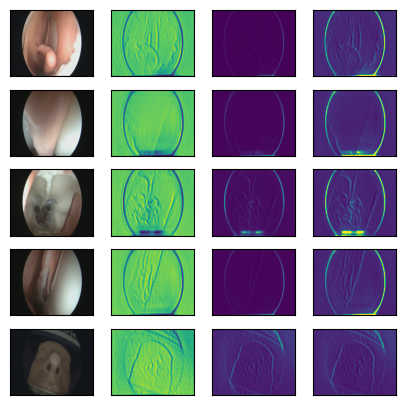

In [53]:
if __name__ == "__main__":
    opt = MonodepthOptions_notebook().parse()
    opt.data_path = '../Endonasal_Phantom/'
    opt.dataset = 'endonasal'
    opt.eval_split = 'endovis'
    opt.load_weights_folder = 'logs_withpretrained/mdp/models/weights_4'
    # opt.load_weights_folder = '../weights_scared'
    opt.recon_save_dir = 'recon_endonasal_phantom'
    opt.batch_size = 8
    opt.eval_mono = 1
    opt.visualize_depth = 1
    opt.save_recon = 1
    evaluate(opt)

circle


(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x79ea8bab90c0>)

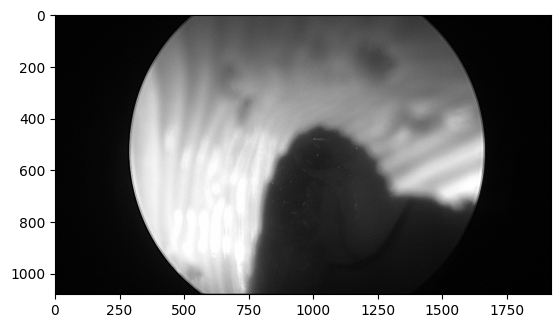

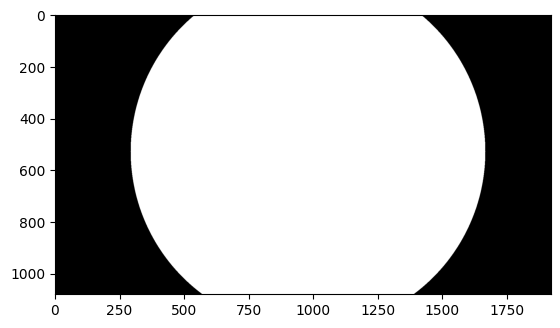

In [30]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
image = Image.open('/content/Endonasal_Phantom/rec_1_endo/00000127.png').convert('L')
gray = np.array(image)
# image = np.array(img_pil)
# gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
# image = cv2.imread('../Endonasal_Phantom/rec_1_endo/00000127.png', cv2.IMREAD_COLOR)
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

mask = np.zeros(gray.shape)
# detect circles in the image
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1.7, 100)
if circles is not None:
    print('circle')
    circles = np.round(circles[0, :]).astype("int")
    (x, y, r) = circles[0:1][0]
    cv2.circle(mask, (x, y), r, 255, -1)

plt.figure(121), plt.imshow(image, cmap='gray')
plt.figure(122), plt.imshow(mask, cmap='gray')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob

img_path = glob('/content/Endonasal_Phantom/*/*.png')
img_path.sort()
for path in img_path:
    # Read image.
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    output = image.copy()
    # Convert to grayscale.
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    mask = np.zeros(gray.shape)
    # Blur using 3 * 3 kernel.
    # gray_blurred = cv2.blur(gray, (3, 3))

    # detect circles in the image
    circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1.7, 100)
    # ensure at least some circles were found
    if circles is None:
        print(path)

/content/Endonasal_Phantom/rec_11_endo/00000083.png


(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x799a2a167430>)

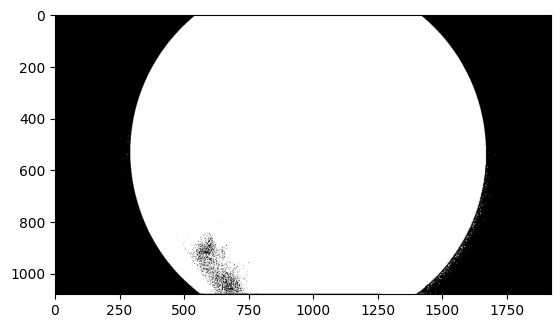

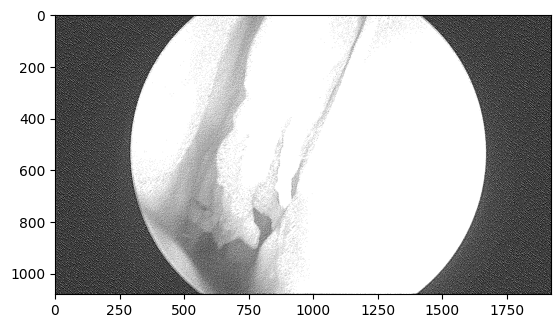

In [106]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
image = cv2.imread('Endonasal_Phantom/reconstruction/00000079.png')
grayimage =cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
thresholdimage = cv2.threshold(grayimage,25,255,cv2.THRESH_BINARY)[1]
plt.figure(121),plt.imshow(thresholdimage, cmap='gray')

img_pil = Image.open('Endonasal_Phantom/reconstruction/00000079.png')
img_bw = img_pil.convert('1')
img_bw = np.array(img_bw).astype(int)

mask = np.array(img_bw, dtype=np.uint8)
kernel_size = 2
kernel = np.ones((kernel_size, kernel_size), np.uint8)

# Apply dilation to connect nearby regions
dilated_image = cv2.dilate(mask, kernel, iterations=1)
plt.figure(122),plt.imshow(dilated_image, cmap='gray')
# img_bw[img_bw==1] = 255
# mask = np.logical_and(img_bw == 0, img_bw < 255)
# mask = np.logical_and(img_bw == 0, img_bw < 255)
# mask = np.multiply(img_bw, img_bw)
# print(np.sum(grayimage))
# grayimage [img_bw==0] = 0
# print(np.unique(grayimage), np.sum(grayimage))
# grayimage [img_bw==1] = 50
# print(np.unique(grayimage), np.sum(grayimage))
# grayimage =cv2.cvtColor(grayimage,cv2.COLOR_BGR2GRAY)

# thresholdimage = cv2.threshold(grayimage,0.5,255,cv2.THRESH_BINARY)[1]
# print(np.unique(mask))

# mask[mask>0.3] = 255
# mask = np.array(mask, dtype=np.uint8)
# print(mask.shape, np.unique(mask))
# resized_mask = cv2.resize(mask, (1920, 1080))
# print(resized_mask.shape, np.unique(resized_mask))
# print(resized_mask)
# plt.figure(122),plt.imshow(resized_mask, cmap='gray')
# cv2.imwrite('test.png', resized_mask*255)

In [54]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('recon_endonasal_phantom/00000079.ply')
points = np.asarray(pcd.points)
# print(pcd)
# print(np.asarray(pcd.points))

colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5


fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()

Load a ply point cloud, print it, and render it
